In [1]:
# from IPython.parallel import Client
# c = Client(profile='parallel_python2.7')
# dview = c.direct_view()
# lview = c.load_balanced_view()
import ipyparallel as ipp

In [2]:
ipp.__path__

['/usr/local/anaconda/lib/python2.7/site-packages/ipyparallel']

In [3]:
c = ipp.Client(profile='parallel2') 

In [4]:
dview = c.direct_view() 
lview = c.load_balanced_view() 

In [5]:
import numpy as np
import netCDF4
from scipy import io
from sstanalysis import gfd
from scipy import interpolate as naiso
from matplotlib import pyplot as plt
%matplotlib inline

In [6]:
with dview.sync_imports():
    import numpy
    import os
    import netCDF4
    import warnings
    from scipy import io
    from scipy import interpolate
    from matplotlib import pyplot
    from scipy import linalg
    from scipy import signal
    from scipy import fftpack
    from warnings import warn
    #from sstanalysis import popmodel

importing numpy on engine(s)
importing os on engine(s)
importing netCDF4 on engine(s)
importing warnings on engine(s)
importing io from scipy on engine(s)
importing interpolate from scipy on engine(s)
importing pyplot from matplotlib on engine(s)
importing linalg from scipy on engine(s)
importing signal from scipy on engine(s)
importing fftpack from scipy on engine(s)
importing warn from warnings on engine(s)


In [7]:
base_dir = '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/'

dlat, dlon = (10., 10.)
lat_start, lat_end = (-60., 50.)
lon_start, lon_end = (5., 345.)
west, south = (lon_start, lat_start)
east, north = (west+dlon, south+dlat)
Degx, Degy = (int((lon_end-lon_start)/dlon), int((lat_end-lat_start)/dlat))
lon_global = np.arange(lon_start, lon_end+2*dlon, dlon)
lat_global = np.arange(lat_start, lat_end+2*dlat, dlat)
Lon_global, Lat_global = np.meshgrid(lon_global, lat_global)
L_1_global = np.zeros((Degy+1,Degx+1)) 

In [8]:
roll = -1080
fname = base_dir + 'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0046-02-01.nc'
f = netCDF4.Dataset(fname)
mask = f.variables['KMT'][:]<=1
tlon = np.roll(np.ma.masked_array(f.variables['TLONG'][:],mask), roll, axis=1)
tlat = np.roll(np.ma.masked_array(f.variables['TLAT'][:],mask), roll, axis=1)
lonrange=np.array([lon_start, lon_end])
latrange=np.array([lat_start, lat_end+5.])
lonmask = (tlon >= lonrange[0]) & (tlon < lonrange[1])
latmask = (tlat >= latrange[0]) & (tlat < latrange[1])
boxidx = lonmask & latmask # this won't necessarily be square
irange = np.where(boxidx.sum(axis=0))[0]
imin_bound, imax_bound = irange.min(), irange.max()
jrange = np.where(boxidx.sum(axis=1))[0]
jmin_bound, jmax_bound = jrange.min(), jrange.max()


npzfile = np.load('interpLatnLon.npz')
print npzfile.files
tlat = npzfile['arr_0']
tlon = npzfile['arr_1']


#Nt, Ny, Nx = SSH.shape
Ny_full = jmax_bound+100-jmin_bound
Nx_full = imax_bound+100-imin_bound
#SSH_full = np.ma.zeros((Nt*5, Ny_full, Nx_full))
#SSH_masked = np.ma.zeros((Nt,Ny,Nx))
fname_mat = ['' for x in range(5)]

['arr_1', 'arr_0']


In [9]:
def fit_loglog(x, y):
    # fig log vs log
    p = np.polyfit(np.log2(x), np.log2(y), 1)
    y_fit = 2**(np.log2(x)*p[0] + p[1])
    #A = np.vstack([np.log2(x), np.ones(len(x))]).T
    #a, b = np.linalg.lstsq(A, np.log2(y))[0]
    #y_fit = 2**(np.log2(x)*a + b)
    
    return y_fit, p[0]

In [10]:
N = 128
M = 3
isospecs_ave = np.zeros((M,(Degy+1)*(Degx+1),N))
Deg_Free = np.zeros(M)
print isospecs_ave.shape, Degx, Degy

(3, 420, 128) 34 11


In [11]:
psd_slopes_summer_global = numpy.zeros((3, Degy+1,Degx+1))
psd_levels_summer_global = numpy.zeros((3, Degy+1,Degx+1))

In [12]:
month = 9
for yearnum in range(5):
    fname = os.path.join(base_dir,
                                 'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday%1d.%04d-%02d-01.nc' 
                                 % (1, yearnum+46, month))
    fname_mat[yearnum] = fname
    f = netCDF4.Dataset(fname)
    mask = f.variables['KMT'][:] <= 1
        
    #for i in range(Nt):
        #SSH_masked[i] = 1e-2*np.roll(np.ma.masked_array(f.variables['SSH_2'][i],mask), roll, axis=1)
    
    #SSH_full[Nt*yearnum:Nt*yearnum+Nt] = SSH_masked[:, jmin_bound:jmax_bound+100, imin_bound:imax_bound+100] 
    
mask_global = np.roll(mask, roll, axis=1)[jmin_bound:jmax_bound+100, imin_bound:imax_bound+100]
print fname_mat
    
Ny, Nx = tlon.shape
    
dview.scatter('fname', fname_mat)
dview['Nx_global'] = Nx
dview['Ny_global'] = Ny
dview['Lon'] = tlon
dview['Lat'] = tlat
dview['mask'] = mask_global
dview['imin_bound'] = imin_bound
dview['imax_bound'] = imax_bound
dview['jmin_bound'] = jmin_bound
dview['jmax_bound'] = jmax_bound
dview['lon_start'] = lon_start
dview['lon_end'] = lon_end
dview['lat_start'] = lat_start
dview['lat_end'] = lat_end
dview['dlat'] = dlat
dview['dlon'] = dlon
dview['Degx'] = Degx
dview['Degy'] = Degy
dview['N'] = N

['/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0046-09-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0047-09-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0048-09-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0049-09-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0050-09-01.nc']


In [13]:
%%px
import sys
sys.path.append('/home/takaya/sst_analysis/sstanalysis/')
import popmodel
reload(popmodel)
    
crit = 0.01
j,i = (0,0)
west, south = (lon_start, lat_start)
east, north = (west+dlon, south+dlat)
#Lon_global, Lat_global = numpy.meshgrid(lon_global, lat_global)
nanarray = numpy.zeros(N)
nanarray[:] = numpy.NAN

nday = 1
for yearnum in range(len(fname)):
#daynum = 0
#for month in np.arange(1,13):
    #fname = os.path.join(base_dir,
    #'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday%1d.%04d-02-01.nc' 
    #% (nday, yearnum+45))
    #print fname
    p = popmodel.POPFile(fname[yearnum])
    # add extra variables to p
    # - dissipation
    # - air sea flux
    
    while south < lat_end+dlat:
        west = lon_start
        east = west+dlon
        i = 0
        while west < lon_end+dlon:

            lonrange = numpy.array([west,east])
            latrange = numpy.array([south,north])
            lonmask = (Lon >= lonrange[0]) & (Lon < lonrange[1])
            latmask = (Lat >= latrange[0]) & (Lat < latrange[1])
            boxidx = lonmask & latmask # this won't necessarily be square
            irange = numpy.where(boxidx.sum(axis=0))[0]
            imin, imax = irange.min(), irange.max()
            jrange = numpy.where(boxidx.sum(axis=1))[0]
            jmin, jmax = jrange.min(), jrange.max()
            #print imin, imax, jmin, jmax
        
            
            region_mask = mask[jmin:jmax, imin:imax]
            Ny, Nx = region_mask.shape
            land_fraction = region_mask.sum().astype('f8') / (Ny*Nx)
            #SSH_domain = SSH[..., jmin:jmax, imin:imax]

    
            if south < lat_end+dlat:
                if west < lon_end+dlon:
                    if land_fraction<crit:
                    #print 'Index range (i): ', imin, imax
                    #print 'Index range (j): ', jmin, jmax
                    # February
                    #NtFeb = 0.
                    # load data files
                    
                        
                        #T = p.nc.variables['SST'][:]
                        Neff, Nt_month, Nx, Ny, k, l, spac2_ave_month, tilde2_sum_month, breve2_sum_month, Ki, isospec_month, area, lon, lat, land_frac, MAX_LAND = p.power_spectrum_2d(
                                                varname='SSS', roll=-1080, xmin=imin, xmax=imax, ymin=jmin, ymax=jmax, ymin_bound=jmin_bound, ymax_bound=jmax_bound, xmin_bound=imin_bound, xmax_bound=imax_bound)
                        if yearnum == 0:
                            isospec_sum_month = numpy.zeros(N)
                            if j==0 and i==0:
                                isospecs_month = numpy.zeros(((Degx+1)*(Degy+1),N))
                                Kis_month = numpy.zeros(((Degx+1)*(Degy+1),N))
                        isospec_sum_month += isospec_month
                        #NtFeb += Nt_Feb

                        #isospec_ave_Feb = isospec_sum_Feb/yearnum
                        #
                        #print isospec_sum_Feb
                        isospecs_month[(Degx+1)*j+i] = isospec_sum_month
                        #if (Degx+1)*j+i>=400:
                        #    print (Degx+1)*j+i
                        #    print isospecs_month[(Degx+1)*j+i]
                        Kis_month[(Degx+1)*j+i] = Ki
               
                    else:
                        isospecs_month[(Degx+1)*j+i] = nanarray
                        Kis_month[(Degx+1)*j+i] = nanarray
                        #if (Degx+1)*j+i>=400:
                        #    print (Degx+1)*j+i
                        #    print isospecs_month[(Degx+1)*j+i]
                        #print 'Too much land coverage'
                        #Lon_global[j,i] = tlon[jmin,imin]
                        #Lat_global[j,i] = tlat[jmin,imin]
                        #Lon_max[j,i] = tlon[jmin,imax]
                        #Lat_max[j,i] = tlat[jmax,imin]
                        #Lon_upright_corn = tlon[jmax,imax]
                        #Lat_upright_corn = tlat[jmax,imax]
                        #psd_slopes_Feb_global[j,i] = np.nan
                        #psd_slopes_Aug_global[j,i] = np.nan
                        #psd_level_Feb_global[j,i] = np.nan
                        #psd_level_Aug_global[j,i] = np.nan
                        #L_1_global[j,i] = np.nan
            
                        #plt.figure(figsize=(15,4))
                        #plt.subplot(121)
                        #plt.pcolormesh(tlon[jmin:jmax, imin:imax], tlat[jmin:jmax, imin:imax], SST_domain)
                        #plt.title('SST (Land coverage: %g)' % land_frac, fontsize=16)
                        #plt.xticks(fontsize=14)
                        #plt.yticks(fontsize=14)
                #else:
                    #Lon_global[j,i] = tlon[jmin,imin]
                    #Lat_global[j,i] = tlat[jmin,imin]
            #else:
                #Lon_global[j,i] = tlon[jmin,imin]
                #Lat_global[j,i] = tlat[jmin,imin]
        
            #if i>0:
                #print 'Zonal range is: ', Lon_global[j,i-1], Lon_global[j,i]
            #if j>0 and i==0:
                #print '  Meridional range is: ', Lat_global[j-1,i], Lat_global[j,i]
            west = east
            east = west+dlon
            i += 1
    
        south = north
        north = south+dlat
        j += 1
    
    
isospecs = numpy.reshape(isospecs_month.copy(),(Degx+1)*(Degy+1)*N)
Kis = numpy.reshape(Kis_month.copy(),(Degx+1)*(Degy+1)*N)

[stderr:0] 
/home/takaya/sst_analysis/sstanalysis/popmodel.py:587: UserWarning: The sector has land (land_fraction=0.000522466) but we are interpolating it out.
  warnings.warn(errstr)
/home/takaya/sst_analysis/sstanalysis/popmodel.py:587: UserWarning: The sector has land (land_fraction=0.000174155) but we are interpolating it out.
  warnings.warn(errstr)
/home/takaya/sst_analysis/sstanalysis/popmodel.py:587: UserWarning: The sector has land (land_fraction=0.000928829) but we are interpolating it out.
  warnings.warn(errstr)
/home/takaya/sst_analysis/sstanalysis/popmodel.py:587: UserWarning: The sector has land (land_fraction=0.00267038) but we are interpolating it out.
  warnings.warn(errstr)
/home/takaya/sst_analysis/sstanalysis/popmodel.py:587: UserWarning: The sector has land (land_fraction=0.0049344) but we are interpolating it out.
  warnings.warn(errstr)
/home/takaya/sst_analysis/sstanalysis/popmodel.py:587: UserWarning: The sector has land (land_fraction=0.000348311) but we are

In [14]:
Neff = dview['Neff']
isospecs_full_month = dview.gather('isospecs').get()
Kis_full_month = dview.gather('Kis').get()

cluster_num = 5
isospecs_full = np.reshape(isospecs_full_month,(cluster_num,isospecs_full_month.shape[0]/N/cluster_num,N))
Kis = np.reshape(Kis_full_month,(cluster_num,isospecs_full_month.shape[0]/N/cluster_num,N))[0]

year_num = 5
index = 2
isospecs_ave[index] = isospecs_full.sum(axis=0)/(year_num*Neff[0]) 
Deg_Free[index] = Neff[0]*year_num
print isospecs_ave[index].shape, isospecs_full.sum(axis=0).shape, Deg_Free[index]

(420, 128) (420, 128) 15.0


In [15]:
#Le = 9e1
#Ls = 3e2
#Ns = 0
#Ne = 0
#for j in range(Degy+1):
#    for i in range(Degx+1):
        #for k in np.arange(1,100):
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Lss and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Ls:
        #        Ns = k
        #        print 'Ns: ', Ns
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Le and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Lee:
        #        Ne = k
        #        print 'Ne: ', Ne
#        Ns = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls)).argmin()
#        Ne = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le)).argmin()
            #print Ns, Ne
#        if np.all(np.isnan(isospecs_ave[index,(Degx+1)*j+i,Ns:Ne])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
#            ps_fit, ps_slope = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne])
#            psd_slopes_winter_global[index,j,i] = ps_slope
#            psd_levels_winter_global[index,j,i] = ps_fit[-1]
#        else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#            psd_slopes_winter_global[index,j,i] = np.NAN
#            psd_levels_winter_global[index,j,i] = np.NAN

In [16]:
from tempfile import TemporaryFile
SSS_summer_parallel = TemporaryFile()
np.savez('SSS_summer_parallel', PSD=isospecs_ave, Ki=Kis, Deg_Freedom=Deg_Free)
SSS_summer_parallel.seek(0)

In [21]:
npzfile = np.load('SSS_winter_parallel.npz')
print npzfile.files
isospecs_winter_SSS = npzfile['PSD']

npzfile = np.load('SSS_summer_parallel.npz')
print npzfile.files
isospecs_summer_SSS = npzfile['PSD']
Kis = npzfile['Ki']

['Ki', 'Deg_Freedom', 'PSD']
['Ki', 'Deg_Freedom', 'PSD']


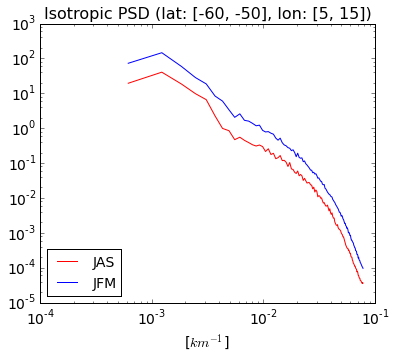

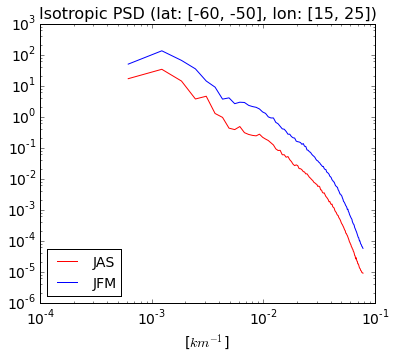

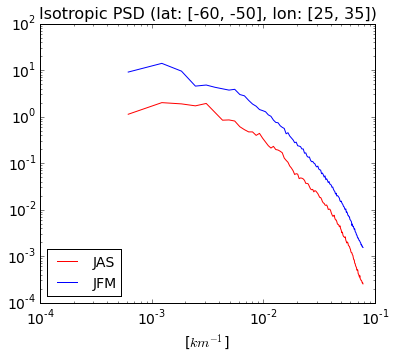

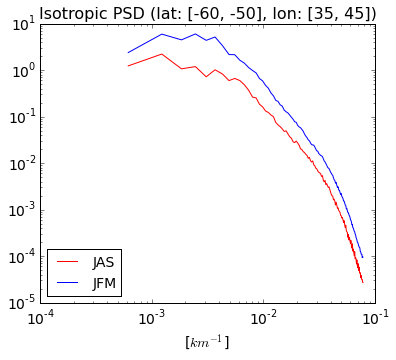

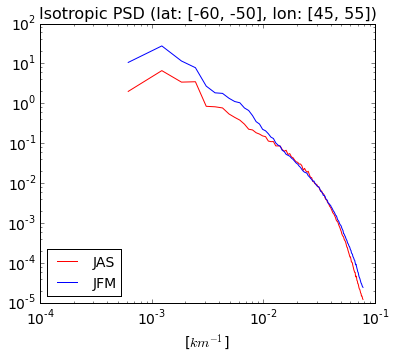

...

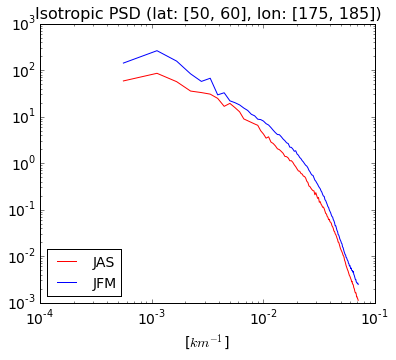

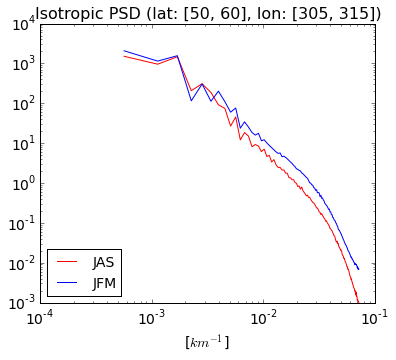

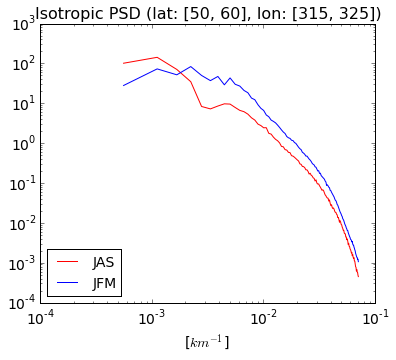

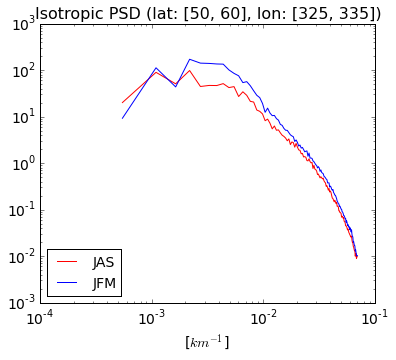

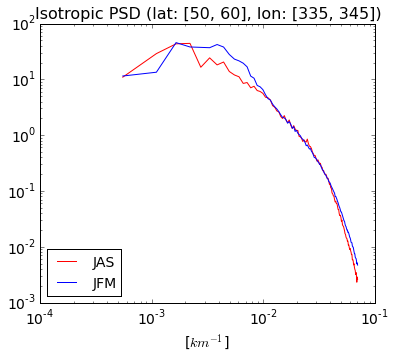

In [23]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']

#Le = 9e1
#Ls = 3e2
N = 128
for j in range(Degy+1):
    for i in range(Degx+1):
        if np.all(np.isnan(isospecs_summer_SSS.mean(axis=0)[(Degx+1)*j+i])) == False and np.all(np.isnan(isospecs_winter_SSS.mean(axis=0)[(Degx+1)*j+i])) == False:
            
            #Ns = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls))
            #Ne = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le))
            #print 2*np.pi/Kis[(Degx+1)*j+i,Ns]*1e-3, 2*np.pi/Kis[(Degx+1)*j+i,Ne]*1e-3
            #print Kis[(Degx+1)*j+i,Ns]*.5/np.pi*1e3, Kis[(Degx+1)*j+i,Ne]*.5/np.pi*1e3
            
            #ps_fit_summer, ps_slope_summer = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne+1], isospecs_ave_summer[1,(Degx+1)*j+i,Ns:Ne+1])
            #ps_fit_winter, ps_slope_winter = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne+1], isospecs_ave_winter[1,(Degx+1)*j+i,Ns:Ne+1])
            plt.figure(figsize=(6,5))
            #plt.subplot(Degy+1,Degx+1,(Degx+1)*j+i+1)
            plt.loglog(Kis[(Degx+1)*j+i]*1e3, isospecs_summer_SSS.mean(axis=0)[(Degx+1)*j+i], 'r', label=r'JAS')
            plt.loglog(Kis[(Degx+1)*j+i]*1e3, isospecs_winter_SSS.mean(axis=0)[(Degx+1)*j+i] / (2*np.pi**2) / (2*np.pi), 'b', label=r'JFM')
            #plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_summer_KE[1,(Degx+1)*j+i], 'r', label=r'August (slope: %g)' % ps_slope_summer)
            #plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_winter_KE[1,(Degx+1)*j+i], 'b', label=r'February (slope: %g)' % ps_slope_winter)
            #plt.loglog(Kis[(Degx+1)*j+i,Ns:Ne+1]*.5/np.pi*1e3, ps_fit_summer, 'k')
            #plt.loglog(Kis[(Degx+1)*j+i,Ns:Ne+1]*.5/np.pi*1e3, ps_fit_winter, 'k')
            plt.xlabel('[$km^{-1}$]', fontsize=14)
            plt.legend(loc='lower left', fontsize=14)
            plt.title('Isotropic PSD (lat: [%g, %g], lon: [%g, %g])' % (Lat[j,0], Lat[j+1,0], Lon[0,i], Lon[0,i+1]), fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.show()

['Ki', 'Deg_Freedom', 'PSD']
['Ki', 'Deg_Freedom', 'PSD']


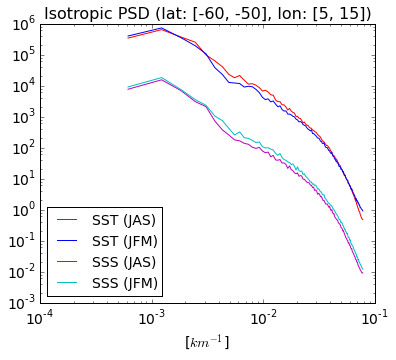

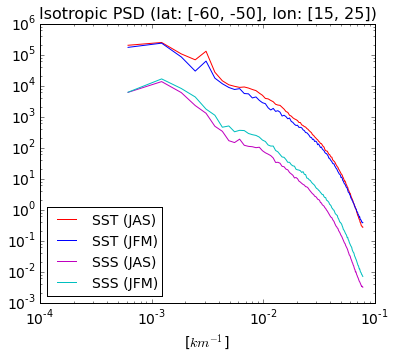

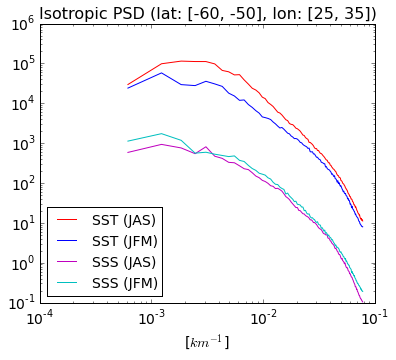

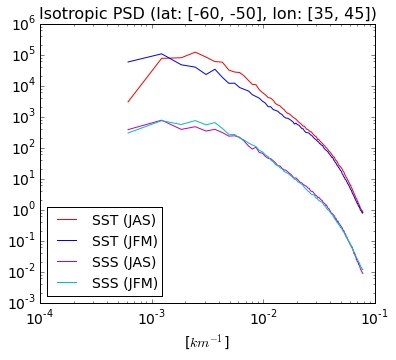

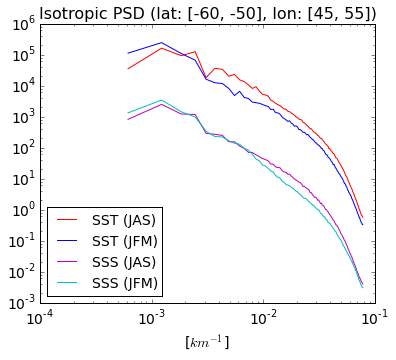

...

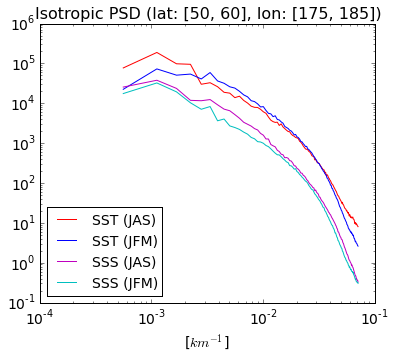

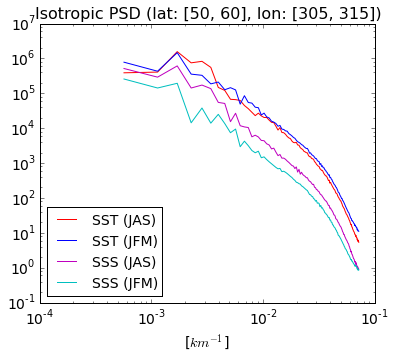

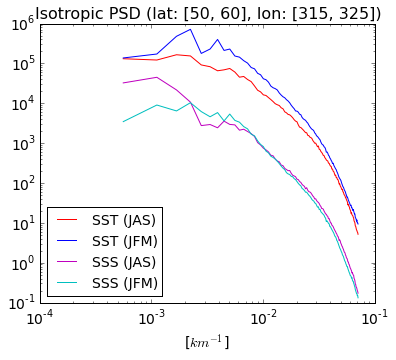

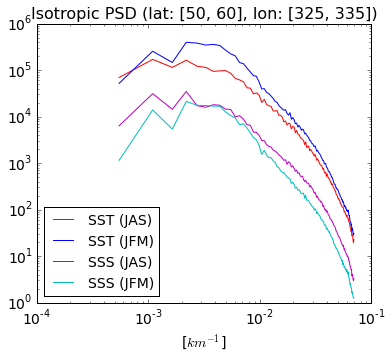

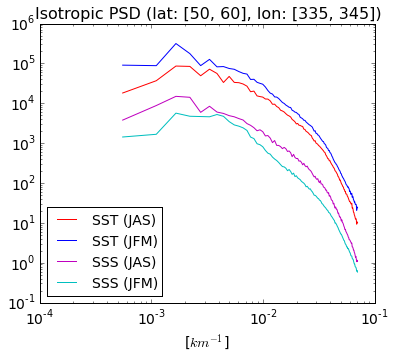

In [7]:
npzfile = np.load('SST_winter_parallel.npz')
print npzfile.files
#psd_slopes_winter_global = npzfile['slopes']
#psd_levels_winter_global = npzfile['Plevel']
isospecs_winter_SST = npzfile['PSD']
Kis = npzfile['Ki']

npzfile = np.load('SST_summer_parallel.npz')
print npzfile.files
#psd_slopes_summer_global = npzfile['slopes']
#psd_levels_summer_global = npzfile['Plevel']
isospecs_summer_SST = npzfile['PSD']

fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']

#Le = 9e1
#Ls = 3e2
N = 128
for j in range(Degy+1):
    for i in range(Degx+1):
        if np.all(np.isnan(isospecs_summer_SSS.mean(axis=0)[(Degx+1)*j+i])) == False and np.all(np.isnan(isospecs_winter_SSS.mean(axis=0)[(Degx+1)*j+i])) == False:
            
            #Ns = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls))
            #Ne = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le))
            #print 2*np.pi/Kis[(Degx+1)*j+i,Ns]*1e-3, 2*np.pi/Kis[(Degx+1)*j+i,Ne]*1e-3
            #print Kis[(Degx+1)*j+i,Ns]*.5/np.pi*1e3, Kis[(Degx+1)*j+i,Ne]*.5/np.pi*1e3
            
            #ps_fit_summer, ps_slope_summer = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne+1], isospecs_ave_summer[1,(Degx+1)*j+i,Ns:Ne+1])
            #ps_fit_winter, ps_slope_winter = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne+1], isospecs_ave_winter[1,(Degx+1)*j+i,Ns:Ne+1])
            plt.figure(figsize=(6,5))
            #plt.subplot(Degy+1,Degx+1,(Degx+1)*j+i+1)
            plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_summer_SST.mean(axis=0)[(Degx+1)*j+i], 'r', label=r'SST (JAS)')
            plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_winter_SST.mean(axis=0)[(Degx+1)*j+i], 'b', label=r'SST (JFM)')
            plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_summer_SSS.mean(axis=0)[(Degx+1)*j+i], 'm', label=r'SSS (JAS)')
            plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_winter_SSS.mean(axis=0)[(Degx+1)*j+i], 'c', label=r'SSS (JFM)')
            #plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_summer_KE[1,(Degx+1)*j+i], 'r', label=r'August (slope: %g)' % ps_slope_summer)
            #plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_winter_KE[1,(Degx+1)*j+i], 'b', label=r'February (slope: %g)' % ps_slope_winter)
            #plt.loglog(Kis[(Degx+1)*j+i,Ns:Ne+1]*.5/np.pi*1e3, ps_fit_summer, 'k')
            #plt.loglog(Kis[(Degx+1)*j+i,Ns:Ne+1]*.5/np.pi*1e3, ps_fit_winter, 'k')
            plt.xlabel('[$km^{-1}$]', fontsize=14)
            plt.legend(loc='lower left', fontsize=14)
            plt.title('Isotropic PSD (lat: [%g, %g], lon: [%g, %g])' % (Lat[j,0], Lat[j+1,0], Lon[0,i], Lon[0,i+1]), fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.show()